# EDA for Kick Starter Project

## Step 1: Import libraries and file

In [2]:
# Importing all libraries
import pandas as pd
import glob # For combining csv files
from IPython.display import display

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
import seaborn as sns

pd.options.display.max_columns = None
pd.set_option('display.max_rows', None)
pd.set_option('display.float_format', '{:,.2f}'.format)

import warnings
warnings.filterwarnings('ignore')

In [3]:
# Import CSV files together
path = r'/Users/hsb/neuefische/2_MLalgorithms/kickstarter_project2_team4/data' # use your path
all_files = glob.glob(path + "/*.csv")

li = []

for filename in all_files:
    df_ = pd.read_csv(filename, index_col=None, header=0)
    li.append(df_)

df = pd.concat(li, axis=0, ignore_index=True)

In [4]:
df.head()
#df.info()

,backers_count,blurb,category,converted_pledged_amount,country,created_at,creator,currency,currency_symbol,currency_trailing_code,current_currency,deadline,disable_communication,friends,fx_rate,goal,id,is_backing,is_starrable,is_starred,launched_at,location,name,permissions,photo,pledged,profile,slug,source_url,spotlight,staff_pick,state,state_changed_at,static_usd_rate,urls,usd_pledged,usd_type
0,315,Babalus Shoes,"{""id"":266,""name"":""Footwear"",""slug"":""fashion/fo...",28645,US,1541459205,"{""id"":2094277840,""name"":""Lucy Conroy"",""slug"":""...",USD,$,True,USD,1552539775,False,NaN,1.00,"28,000.00",2108505034,NaN,False,NaN,1548223375,"{""id"":2462429,""name"":""Novato"",""slug"":""novato-c...",Babalus Children's Shoes,NaN,"{""key"":""assets/023/667/205/a565fde5382d6b53276...","28,645.00","{""id"":3508024,""project_id"":3508024,""state"":""in...",babalus-childrens-shoes,https://www.kickstarter.com/discover/categorie...,False,False,live,1548223375,1.00,"{""web"":{""project"":""https://www.kickstarter.com...","28,645.00",international
1,47,A colorful Dia de los Muertos themed oracle de...,"{""id"":273,""name"":""Playing Cards"",""slug"":""games...",1950,US,1501684093,"{""id"":723886115,""name"":""Lisa Vollrath"",""slug"":...",USD,$,True,USD,1504976459,False,NaN,1.00,"1,000.00",928751314,NaN,False,NaN,1502384459,"{""id"":2400549,""name"":""Euless"",""slug"":""euless-t...",The Ofrenda Oracle Deck,NaN,"{""key"":""assets/017/766/989/dd9f18c773a8546d996...","1,950.00","{""id"":3094785,""project_id"":3094785,""state"":""ac...",the-ofrenda-oracle-deck,https://www.kickstarter.com/discover/categorie...,True,False,successful,1504976459,1.00,"{""web"":{""project"":""https://www.kickstarter.com...","1,950.00",domestic
2,271,"Electra's long awaited, eclectic Debut Pop/Roc...","{""id"":43,""name"":""Rock"",""slug"":""music/rock"",""po...",22404,US,1348987533,"{""id"":323849677,""name"":""Electra"",""is_registere...",USD,$,True,USD,1371013395,False,NaN,1.00,"15,000.00",928014092,NaN,False,NaN,1368421395,"{""id"":2423474,""name"":""Hollywood"",""slug"":""holly...","Record Electra's Debut Album (Pop, Rock, Class...",NaN,"{""key"":""assets/011/433/681/489fd66f7861fefd8c8...","22,404.00","{""id"":359847,""project_id"":359847,""state"":""inac...",record-electras-debut-album-pop-rock-classical,https://www.kickstarter.com/discover/categorie...,True,False,successful,1371013395,1.00,"{""web"":{""project"":""https://www.kickstarter.com...","22,404.00",international
3,3,The Mist of Tribunal is a turn-based card game...,"{""id"":273,""name"":""Playing Cards"",""slug"":""games...",165,GB,1483780271,"{""id"":196281496,""name"":""Artur Ordijanc (delete...",GBP,£,False,USD,1489425776,False,NaN,1.31,"10,000.00",596091328,NaN,False,NaN,1484245376,"{""id"":475457,""name"":""Kaunas"",""slug"":""kaunas-ka...",The Mist of Tribunal - A Card Game,NaN,"{""key"":""assets/015/091/198/216fbf1bdc3739e7971...",136.00,"{""id"":2825329,""project_id"":2825329,""state"":""in...",the-mist-of-tribunal-a-card-game,https://www.kickstarter.com/discover/categorie...,False,False,failed,1489425776,1.22,"{""web"":{""project"":""https://www.kickstarter.com...",165.38,domestic
4,3,"Livng with a brain impairment, what its like t...","{""id"":48,""name"":""Nonfiction"",""slug"":""publishin...",2820,US,1354817071,"{""id"":1178460181,""name"":""Dawn Johnston"",""is_re...",USD,$,True,USD,1357763527,False,NaN,1.00,"2,800.00",998516049,NaN,False,NaN,1355171527,"{""id"":2507703,""name"":""Traverse City"",""slug"":""t...",Help change the face of Brain Impairment,NaN,"{""key"":""assets/011/457/844/37ba63d35fefaba76e9...","2,820.00","{""id"":417385,""project_id"":417385,""state"":""inac...",help-change-the-face-of-brain-impairment,https://www.kickstarter.com/discover/categorie...,True,False,successful,1357763527,1.00,"{""web"":{""project"":""https://www.kickstarter.com...","2,820.00",domestic


### Column description

backers_count : Amount of people who donated any amount to the project

blurb : Abstract of project / short description

category : information overview of project - how was the project filed?

drop - converted_pledged_amount : amount of money secured in project currency

country : Home country of project

created_at : Timestamp of creation

creator : information about the user creating the project

drop - currency : Currency they accept money in

drop - currency_symbol : symbol of currency 

drop - currency_trailing_code : check if == current_currency

drop - current_currency : currency the money is hold by Kickstarter

deadline : Timestamp of deadline

disable_communication : Possibility to contact project

drop - friends : 

drop - fx_rate : conversion rate for currency

goal : demand of project (money)

id : unique identifier of project

drop - is_backing : 

is_starrable : option if project can be favourised

drop - is_starred

launched_at : timestamp of beginning

location : location of project headquarter

name : name of project

drop - permissions :

photo : hyperlink to picture 

drop - pledged : amount of money received for project

drop - profile : information about profile

drop - slug : 

drop - source_url

spotlight : project appears on homepage

staff_pick : favourited by Kickstarter

state : successful or not? --> target?

state_changed_at : timestamp, when was state changed?

drop - static_usd_rate : similar to fxrate

drop - urls :

usd_pledged : amount of money converted to USD

usd_type : ???

In [5]:
# Quick look unique values
#df.usd_type.unique()

In [6]:
# Quick look into 
#df.profile[0]

## Step 2: Data Cleaning
* ### Remove unwanted columns

In [7]:
df.drop(["converted_pledged_amount", "currency", "currency_symbol", "currency_trailing_code",
         "current_currency", "friends", "fx_rate", "is_backing", "is_starred", "permissions", 
         "pledged", "profile", "slug", "source_url", "static_usd_rate", "urls", "spotlight", 
         "photo"], axis = 1, inplace = True)

In [8]:
df.head()

,backers_count,blurb,category,country,created_at,creator,deadline,disable_communication,goal,id,is_starrable,launched_at,location,name,staff_pick,state,state_changed_at,usd_pledged,usd_type
0,315,Babalus Shoes,"{""id"":266,""name"":""Footwear"",""slug"":""fashion/fo...",US,1541459205,"{""id"":2094277840,""name"":""Lucy Conroy"",""slug"":""...",1552539775,False,"28,000.00",2108505034,False,1548223375,"{""id"":2462429,""name"":""Novato"",""slug"":""novato-c...",Babalus Children's Shoes,False,live,1548223375,"28,645.00",international
1,47,A colorful Dia de los Muertos themed oracle de...,"{""id"":273,""name"":""Playing Cards"",""slug"":""games...",US,1501684093,"{""id"":723886115,""name"":""Lisa Vollrath"",""slug"":...",1504976459,False,"1,000.00",928751314,False,1502384459,"{""id"":2400549,""name"":""Euless"",""slug"":""euless-t...",The Ofrenda Oracle Deck,False,successful,1504976459,"1,950.00",domestic
2,271,"Electra's long awaited, eclectic Debut Pop/Roc...","{""id"":43,""name"":""Rock"",""slug"":""music/rock"",""po...",US,1348987533,"{""id"":323849677,""name"":""Electra"",""is_registere...",1371013395,False,"15,000.00",928014092,False,1368421395,"{""id"":2423474,""name"":""Hollywood"",""slug"":""holly...","Record Electra's Debut Album (Pop, Rock, Class...",False,successful,1371013395,"22,404.00",international
3,3,The Mist of Tribunal is a turn-based card game...,"{""id"":273,""name"":""Playing Cards"",""slug"":""games...",GB,1483780271,"{""id"":196281496,""name"":""Artur Ordijanc (delete...",1489425776,False,"10,000.00",596091328,False,1484245376,"{""id"":475457,""name"":""Kaunas"",""slug"":""kaunas-ka...",The Mist of Tribunal - A Card Game,False,failed,1489425776,165.38,domestic
4,3,"Livng with a brain impairment, what its like t...","{""id"":48,""name"":""Nonfiction"",""slug"":""publishin...",US,1354817071,"{""id"":1178460181,""name"":""Dawn Johnston"",""is_re...",1357763527,False,"2,800.00",998516049,False,1355171527,"{""id"":2507703,""name"":""Traverse City"",""slug"":""t...",Help change the face of Brain Impairment,False,successful,1357763527,"2,820.00",domestic


* ### Check for null values

In [9]:
# Check for Null values
df.isnull().sum()

backers_count              0
blurb                      8
category                   0
country                    0
created_at                 0
creator                    0
deadline                   0
disable_communication      0
goal                       0
id                         0
is_starrable               0
launched_at                0
location                 226
name                       0
staff_pick                 0
state                      0
state_changed_at           0
usd_pledged                0
usd_type                 480
dtype: int64

* ### Conversions

In [10]:
# Converting time stamps 
df['deadline'] = pd.to_datetime(df['deadline'], unit='s')#.dt.strftime('%Y-%m-%d')
df['state_changed_at'] = pd.to_datetime(df['state_changed_at'], unit='s')#.dt.strftime('%Y-%m-%d')
df['launched_at'] = pd.to_datetime(df['launched_at'], unit='s')#.dt.strftime('%Y-%m-%d')
df['created_at'] = pd.to_datetime(df['created_at'], unit='s')#.dt.strftime('%Y-%m-%d')

In [11]:
# Abstracting information from category column
df["category_slug"] = [df.category[idx].split(",")[2].split(":")[1][1:-1] for idx, i in enumerate(df.category)]
# Abstracting information from creator column
df["creator_name"] = [df.creator[idx].split(",")[1].split(":")[1][1:-1] for idx, i in enumerate(df.creator)]
# Abstracting location 
# To be resolved..

In [12]:
# We wish to replace empty cells
df["location"] = df["location"].fillna('Noinfo')
df["usd_type"] = df["usd_type"].fillna('Noinfo')
df["blurb"] = df["blurb"].fillna('Noinfo')

# Check for empty cells also
#df.eq('').sum()

## Step 3: Feature engineering

* ### Adding new columns related to time

In [13]:
df['created_launch'] = (df['launched_at'] - df['created_at']).dt.days
df['campaign_len'] = (df['deadline'] - df['launched_at']).dt.days

* ### Column for word count of description

In [14]:
df['word_count'] = df['blurb'].str.split().str.len()

In [15]:
df['state_new'] = df['state'].replace({'successful':1, 'failed':0, 'canceled':0, 'suspended':0 })
# dropping live rows
df = df[~df['state_new'].isin(['live'])]
# df['state_new'].unique() # Check

* ### Location column

In [16]:
# Abstracting information from location column
_ = []
for idx, i in enumerate(df.location):
    try: 
        if df.location[idx].index("country"):
            _.append(df.location[idx][df.location[idx].index("country")+10:df.location[idx].index(",", df.location[idx].index("country")+10)-1])
    except:
        _.append("no location")
df["location_iso"] = _


# Getting country names to ISO code
iso = pd.read_csv("data/country/iso_country.csv")

columns_titles = ["Code","Name"]
iso=iso.reindex(columns=columns_titles)

iso_np = np.array(iso)
iso_dic = dict(iso_np)

df["location_country"] = [iso_dic.get(i, "None") for i in df["location_iso"]]

* ### Main category

In [17]:
def category_splitter_slug(df):
    _ = []
    for idx, i in enumerate(df.category_slug):
        try:
            #_.append(i.split(" ")[0])
            _.append(df.category_slug.iloc[idx].split("/")[0])
        except:
            #_.append(df.creator_name[idx])
            _.append(df.category_slug.iloc[idx])
    return _

In [18]:
df["main_category"] = category_splitter_slug(df)

In [19]:
# Final check on columns
df.head()

,backers_count,blurb,category,country,created_at,creator,deadline,disable_communication,goal,id,is_starrable,launched_at,location,name,staff_pick,state,state_changed_at,usd_pledged,usd_type,category_slug,creator_name,created_launch,campaign_len,word_count,state_new,location_iso,location_country,main_category
1,47,A colorful Dia de los Muertos themed oracle de...,"{""id"":273,""name"":""Playing Cards"",""slug"":""games...",US,2017-08-02 14:28:13,"{""id"":723886115,""name"":""Lisa Vollrath"",""slug"":...",2017-09-09 17:00:59,False,"1,000.00",928751314,False,2017-08-10 17:00:59,"{""id"":2400549,""name"":""Euless"",""slug"":""euless-t...",The Ofrenda Oracle Deck,False,successful,2017-09-09 17:00:59,"1,950.00",domestic,games/playing cards,Lisa Vollrath,8,30,22,1,no location,None,games
2,271,"Electra's long awaited, eclectic Debut Pop/Roc...","{""id"":43,""name"":""Rock"",""slug"":""music/rock"",""po...",US,2012-09-30 06:45:33,"{""id"":323849677,""name"":""Electra"",""is_registere...",2013-06-12 05:03:15,False,"15,000.00",928014092,False,2013-05-13 05:03:15,"{""id"":2423474,""name"":""Hollywood"",""slug"":""holly...","Record Electra's Debut Album (Pop, Rock, Class...",False,successful,2013-06-12 05:03:15,"22,404.00",international,music/rock,Electra,224,30,15,1,US,United States,music
3,3,The Mist of Tribunal is a turn-based card game...,"{""id"":273,""name"":""Playing Cards"",""slug"":""games...",GB,2017-01-07 09:11:11,"{""id"":196281496,""name"":""Artur Ordijanc (delete...",2017-03-13 17:22:56,False,"10,000.00",596091328,False,2017-01-12 18:22:56,"{""id"":475457,""name"":""Kaunas"",""slug"":""kaunas-ka...",The Mist of Tribunal - A Card Game,False,failed,2017-03-13 17:22:56,165.38,domestic,games/playing cards,Artur Ordijanc (deleted),5,59,23,0,US,United States,games
4,3,"Livng with a brain impairment, what its like t...","{""id"":48,""name"":""Nonfiction"",""slug"":""publishin...",US,2012-12-06 18:04:31,"{""id"":1178460181,""name"":""Dawn Johnston"",""is_re...",2013-01-09 20:32:07,False,"2,800.00",998516049,False,2012-12-10 20:32:07,"{""id"":2507703,""name"":""Traverse City"",""slug"":""t...",Help change the face of Brain Impairment,False,successful,2013-01-09 20:32:07,"2,820.00",domestic,publishing/nonfiction,Dawn Johnston,4,30,24,1,LT,Lithuania,publishing
5,35,Annapolis Chamber Players is a non-for profit ...,"{""id"":36,""name"":""Classical Music"",""slug"":""musi...",US,2014-10-24 17:35:50,"{""id"":682189804,""name"":""Annapolis Chamber Play...",2015-05-02 02:25:46,False,"3,500.00",1224600291,False,2015-04-02 02:25:46,"{""id"":2354877,""name"":""Annapolis"",""slug"":""annap...",Annapolis Chamber Music Project,False,successful,2015-05-02 02:25:46,"3,725.00",domestic,music/classical music,Annapolis Chamber Players,159,30,18,1,US,United States,music


## Step 4: EDA

In [20]:
print('Earliest Kickstarter: ',df.created_at.min())
print('Latest Kickstarter: ',df.created_at.max())

Earliest Kickstarter:  2009-04-22 02:11:10
Latest Kickstarter:  2019-03-12 19:25:52


* We want to predict for our stakeholder whether or not a Kickstarter campaign will be successful or fail
* Take care of these features below later:
* We need to ensure that we are not using any features that contain future infromation
* like example: staff_pick, backers_count, is_starrable, 

In [21]:
# I like to trim the columns further
df1 = df.copy(deep=True) 
df1.drop(["usd_pledged", "blurb", "disable_communication", "creator", "is_starrable", "location", "staff_pick",
                "name", "state_changed_at", "usd_type", "category_slug",
          "category", "creator_name", "state", "created_at", "deadline", "launched_at"], axis=1, inplace=True)

In [21]:
df1.head()

,backers_count,country,goal,id,created_launch,campaign_len,word_count,state_new,location_iso,location_country,main_category
1,47,US,"1,000.00",928751314,8,30,22,1,no location,None,games
2,271,US,"15,000.00",928014092,224,30,15,1,US,United States,music
3,3,GB,"10,000.00",596091328,5,59,23,0,US,United States,games
4,3,US,"2,800.00",998516049,4,30,24,1,LT,Lithuania,publishing
5,35,US,"3,500.00",1224600291,159,30,18,1,US,United States,music


In [718]:
created_count = df.created_at.value_counts().to_frame().reset_index().rename(columns={'index':'date','created_at': 'count'})
created_count.sort_values(by='date', inplace=True)
# average number of campaings launched each month
print('Average Number of Campaigns Launched Each Year: ', np.round(created_count['count'].mean()))
plt.figure(figsize=[15,10])
ax = sns.barplot(created_count['date'], created_count['count'], color='green')
ax.set_xticklabels(ax.get_xticklabels(),rotation=30)
plt.xlabel("Date Campaign was Created")
plt.ylabel("Number of Kickstarter Campaigns")
plt.title('HISTOGRAM OF KICKSTARTER CAMPAIGNS BY DATE')

plt.show()

Average Number of Campaigns Launched Each Year:  1.0


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x111735160> (for post_execute):


KeyboardInterrupt: 

In [720]:
df1.head()

,backers_count,country,goal,id,created_launch,campaign_len,word_count,state_new,location_iso,location_country,main_category
1,47,US,"1,000.00",928751314,8,30,22,1,no location,None,games
2,271,US,"15,000.00",928014092,224,30,15,1,US,United States,music
3,3,GB,"10,000.00",596091328,5,59,23,0,US,United States,games
4,3,US,"2,800.00",998516049,4,30,24,1,LT,Lithuania,publishing
5,35,US,"3,500.00",1224600291,159,30,18,1,US,United States,music


<AxesSubplot:xlabel='created_at', ylabel='count'>

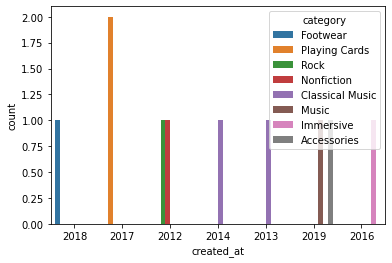

In [232]:
# Top categories
df2 = df.groupby('category')
sns.countplot(x='created_at', data=df.head(10), hue='category')

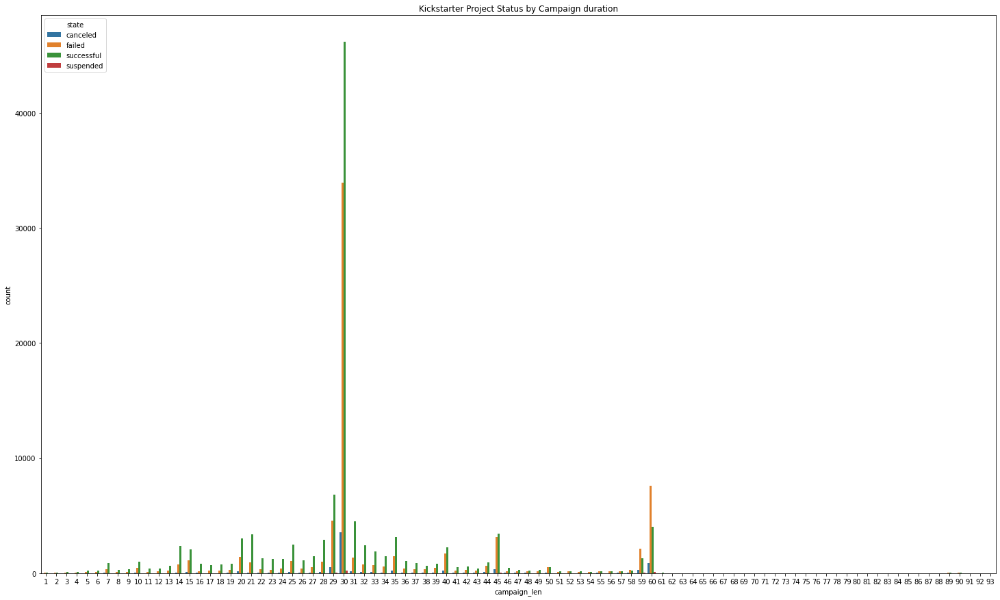

In [38]:
# Project time vs state
df_proj = df.groupby(['campaign_len', 'state'])['state'].size().reset_index(name = 'count')
sns.barplot ('campaign_len', 'count', hue = 'state', data = df_proj)
plt.title('Kickstarter Project Status by Campaign duration') 
plt.rcParams['figure.figsize'] = 25, 15;

* ### Map 

In [142]:
df1['launched_at_year'] = pd.to_datetime(df['launched_at'], unit='s').dt.strftime('%Y')

In [143]:
df3 = df1[df1['launched_at_year']=='2018']

In [144]:
df_3 = df3.loc[df3['location_country']!='None']
df_3 = df3
df_3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 42089 entries, 13 to 209217
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   backers_count     42089 non-null  int64  
 1   country           42089 non-null  object 
 2   goal              42089 non-null  float64
 3   id                42089 non-null  int64  
 4   created_launch    42089 non-null  int64  
 5   campaign_len      42089 non-null  int64  
 6   word_count        42089 non-null  int64  
 7   state_new         42089 non-null  object 
 8   location_iso      42089 non-null  object 
 9   location_country  42089 non-null  object 
 10  main_category     42089 non-null  object 
 11  launched_at_year  42089 non-null  object 
dtypes: float64(1), int64(5), object(6)
memory usage: 4.2+ MB


In [145]:
df3 = df3[['main_category', 'location_country','state_new']]
df3.head(10)

,main_category,location_country,state_new
13,music,United States,1
25,photography,United States,1
26,fashion,France,1
29,music,United States,1
32,fashion,France,1
35,art,Spain,1
52,fashion,United Kingdom,1
53,games,United Kingdom,1
68,fashion,United Kingdom,0
69,art,United States,1


In [151]:
df99 = pd.read_csv('data/country/worldcities.csv')
df99.rename(columns={'country': 'location_country'}, inplace=True)
df99 = df99[['location_country', 'lat', 'lng']]
df99 = df99[:10000]

In [152]:
dfinal = df3.merge(df99, on="location_country", how = 'inner')

In [153]:
dfinal = dfinal[:1000]

In [157]:
#installation
#!pip install folium
# Create a world map to show distributions of users 
import folium
from folium.plugins import MarkerCluster
#empty map
world_map= folium.Map(tiles="cartodbpositron")
marker_cluster = MarkerCluster().add_to(world_map)
#for each coordinate, create circlemarker of user percent
for i in range(len(dfinal)):
        lat = dfinal.iloc[i]['lat']
        long = dfinal.iloc[i]['lng']
        radius=5
                                
        folium.CircleMarker(location = [lat, long], radius=radius, popup= popup_text, fill =True).add_to(marker_cluster)
#show the map
world_map


## Looking into possible correlations
* categories/blurb/name - are they linked?
* backers_count/goal
* staff_pick/spotlight/categories - how do projects get in the spotlight? 
* How would staff pick a project?
* state/staff_pick/backers_count

In [ ]:
df.corr()

In [ ]:
df5 = df1.groupby(['created_year','state_new'])['state_new'].size().reset_index(name = 'count')
df5 = df5[df5['created_year']>'2012']
df5 = df5[df5['created_year']<'2018']

sns.barplot (x='created_year',y='count',data=df5, hue = 'state_new')
plt.xticks(rotation=45)

plt.title('Kickstarter Project Status by Campaign duration') 
plt.rcParams['figure.figsize'] = 20, 8;

## What might have impact on the state?

In [46]:
# checking on entries for state column
df['state'].unique()

array(['live', 'successful', 'failed', 'canceled', 'suspended'],
      dtype=object)

In [60]:
# getting the values
df['state'].value_counts()

successful    117465
failed         75199
canceled        8624
live            7311
suspended        623
Name: state, dtype: int64

<AxesSubplot:xlabel='state', ylabel='count'>

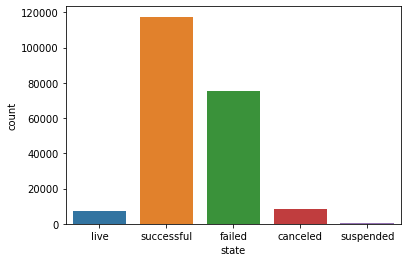

In [92]:
sns.countplot(x='state', data=df)

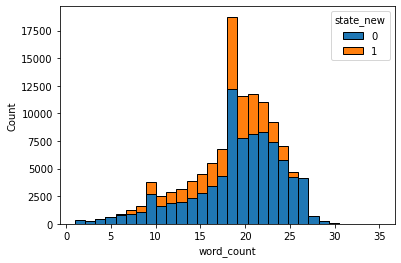

In [44]:
fig_dims = (6, 4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.histplot(x='word_count', hue='state_new', data=df1, bins=30, alpha=1)
plt.savefig("KSWordcount.png", dpi=300)

KeyError: ''

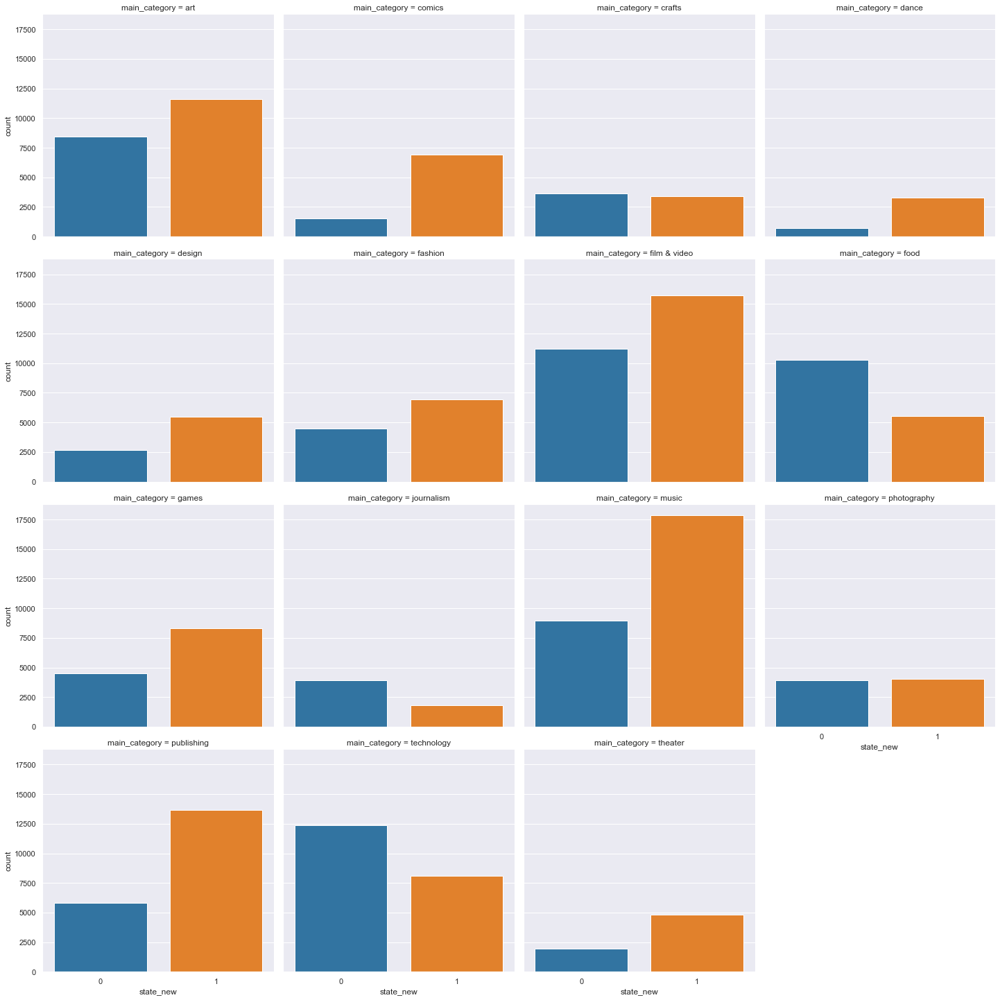

In [48]:
df_proj = df.groupby(['main_category', 'state_new'])['state_new'].size().reset_index(name = 'count')
#sns.barplot('main_category', 'count', hue = 'state_new', data = df_proj)

sns.set(style="darkgrid")

sns.catplot(kind='bar', data=df_proj, x='state_new', y='count', col='main_category',col_wrap=4, ax=ax, palette="tab10", dodge=False)
plt.show()

In [58]:
# staff pick means extra features but occures rarely.
df['staff_pick'].value_counts()

False    182231
True      26991
Name: staff_pick, dtype: int64

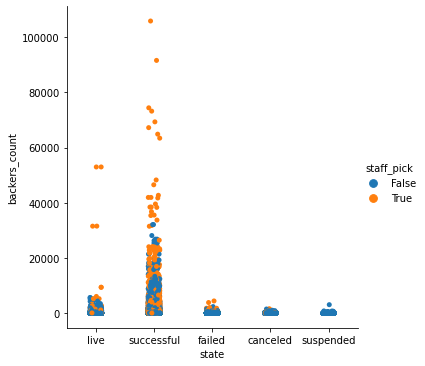

In [68]:
sns.catplot(x="state", y="backers_count", hue="staff_pick", data=df)

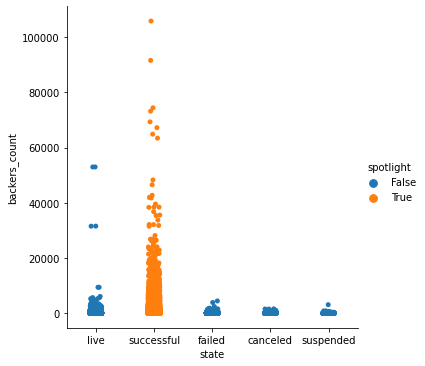

In [67]:
sns.catplot(x="state", y="backers_count", hue="spotlight", data=df)

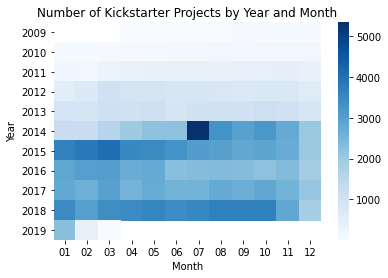

In [92]:
best_year_month = pd.concat([df.created_at.dt.strftime('%Y'), df.created_at.dt.strftime('%m')], axis=1, keys=['Year', 'Month'])
best_year_month
# Which month is the best to launch
best_year_month = best_year_month.groupby(['Year','Month']).size().reset_index(name='counts')
# Creating a 2D Matrix
best_year_month = best_year_month.pivot('Year','Month', 'counts')
# Plotting heatmap
fig_dims = (6, 4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.heatmap(best_year_month, annot = False, cmap = 'Blues', ax=ax)
plt.title('Number of Kickstarter Projects by Year and Month') 
plt.savefig("KSProjectbyYear.png", dpi=300)

In [197]:
#Pandas profiling
from pandas_profiling import ProfileReport
profile = ProfileReport(df, title="Pandas Profiling Report", explorative=True)
profile

Summarize dataset:   0%|          | 0/21 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Step 5: Modelling

In [ ]:
# Dummy columns

In [22]:
#dummy_country = pd.get_dummies(df1["country"])
dummy_category = pd.get_dummies(df1["main_category"], drop_first=True)
df1 = pd.concat([df1, dummy_category], axis = 1)
df1.head()

,backers_count,country,goal,id,created_launch,campaign_len,word_count,state_new,location_iso,location_country,main_category,comics,crafts,dance,design,fashion,film & video,food,games,journalism,music,photography,publishing,technology,theater
1,47,US,"1,000.00",928751314,8,30,22,1,no location,None,games,0,0,0,0,0,0,0,1,0,0,0,0,0,0
2,271,US,"15,000.00",928014092,224,30,15,1,US,United States,music,0,0,0,0,0,0,0,0,0,1,0,0,0,0
3,3,GB,"10,000.00",596091328,5,59,23,0,US,United States,games,0,0,0,0,0,0,0,1,0,0,0,0,0,0
4,3,US,"2,800.00",998516049,4,30,24,1,LT,Lithuania,publishing,0,0,0,0,0,0,0,0,0,0,0,1,0,0
5,35,US,"3,500.00",1224600291,159,30,18,1,US,United States,music,0,0,0,0,0,0,0,0,0,1,0,0,0,0


In [23]:
# Removing more columns 
# Selecting variables and target for ML
df2 = df1.copy(deep=True) 
df2.drop(['backers_count','country', 'id', 'location_iso', 'location_country', 'main_category'], axis=1, inplace=True)
df2.head()

,goal,created_launch,campaign_len,word_count,state_new,comics,crafts,dance,design,fashion,film & video,food,games,journalism,music,photography,publishing,technology,theater
1,"1,000.00",8,30,22,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
2,"15,000.00",224,30,15,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0
3,"10,000.00",5,59,23,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
4,"2,800.00",4,30,24,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0
5,"3,500.00",159,30,18,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0


In [88]:
# Imports for the models
from sklearn.model_selection import train_test_split, GridSearchCV

from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC

from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, classification_report
from sklearn.preprocessing import MinMaxScaler, StandardScaler

In [51]:
# Setup test and train data
y = df2['state_new'].astype(int)[:5000]
X = df2.drop('state_new',axis=1)[:5000]
X = df2.iloc[:,:4][:5000]
print('Numer of rows and Predictors: ',X.shape)

Numer of rows and Predictors:  (5000, 4)


In [52]:
# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=1)

print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_test.shape,  y_test.shape)

Train set: (3750, 4) (3750,)
Test set: (1250, 4) (1250,)


* ### Testing out PCA HERE !

In [53]:
# for c in df2.columns[1:]:
#     df2.boxplot(c,by='state_new',figsize=(7,4),fontsize=14)
#     plt.title("{}\n".format(c),fontsize=16)
#     plt.xlabel("State", fontsize=16)

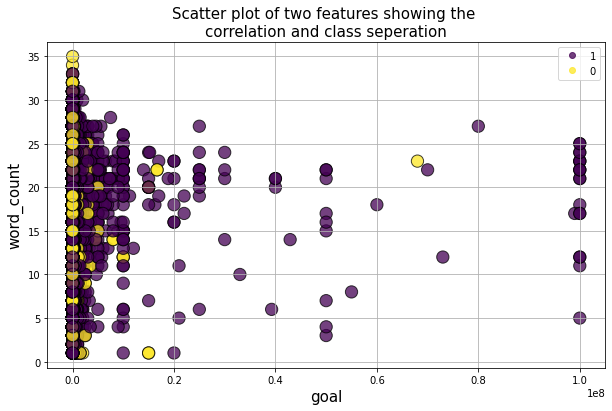

In [54]:
plt.figure(figsize=(10,6))
scatter = plt.scatter(df2['goal'],df2['word_count'],c=df['state_new'],edgecolors='k',alpha=0.75,s=150)
plt.grid(True)
classes = ['1', '0']
plt.legend(handles=scatter.legend_elements()[0], labels=classes)
plt.title("Scatter plot of two features showing the \ncorrelation and class seperation",fontsize=15)
plt.xlabel("goal",fontsize=15)
plt.ylabel("word_count",fontsize=15)
plt.show()

In [55]:
from sklearn.preprocessing import StandardScaler

In [56]:
scaler = StandardScaler()

In [57]:
X_train_scaled = scaler.fit_transform(X_train)

In [58]:
df2_scaled = pd.DataFrame(data=X_train_scaled, columns=X.columns)

In [59]:
from sklearn.decomposition import PCA

In [70]:
pca = PCA(n_components=None)

In [71]:
df2_scaled_pca = pca.fit(df2_scaled)

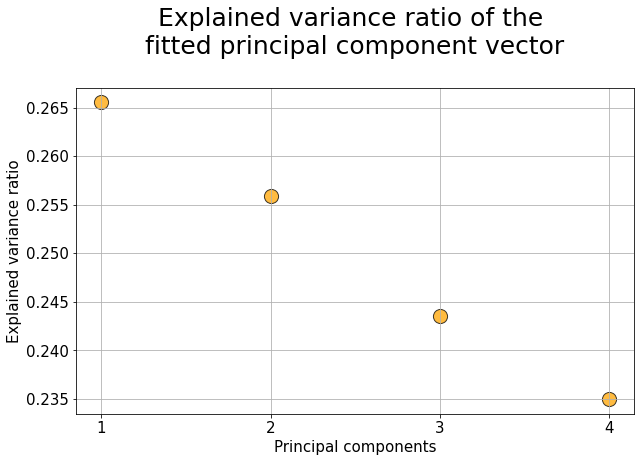

In [91]:
plt.figure(figsize=(10,6))
plt.scatter(x=[i+1 for i in range(len(df2_scaled_pca.explained_variance_ratio_))],
            y=df2_scaled_pca.explained_variance_ratio_,
            s=200, alpha=0.75,c='orange',edgecolor='k')
plt.grid(True)
plt.title("Explained variance ratio of the \nfitted principal component vector\n",fontsize=25)
plt.xlabel("Principal components",fontsize=15)
plt.xticks([i+1 for i in range(len(df2_scaled_pca.explained_variance_ratio_))],fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel("Explained variance ratio",fontsize=15)
plt.show()

In [92]:
X_train_scaled_trans = pca.transform(df2_scaled)

In [93]:
X_train_scaled_trans = pd.DataFrame(data=X_train_scaled_trans)
#X_train_scaled_trans.head(10)

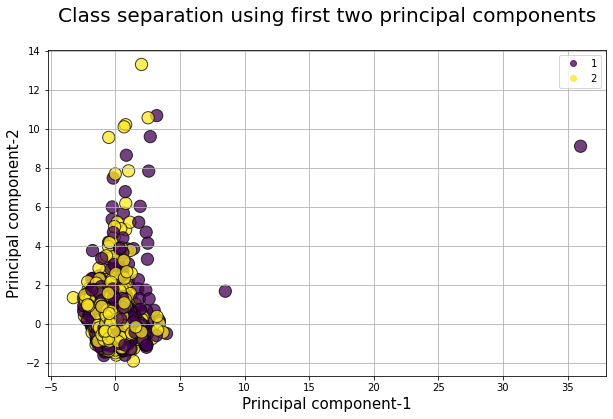

In [94]:
plt.figure(figsize=(10,6))
plt.scatter(X_train_scaled_trans[0],X_train_scaled_trans[1],c=y_train,edgecolors='k',alpha=0.75,s=150)
classes = ['1', '2', '3']
plt.legend(handles=scatter.legend_elements()[0], labels=classes)
plt.grid(True)
plt.title("Class separation using first two principal components\n",fontsize=20)
plt.xlabel("Principal component-1",fontsize=15)
plt.ylabel("Principal component-2",fontsize=15)
plt.show()

In [95]:
from sklearn.naive_bayes import GaussianNB

In [96]:
variables = ["goal", "word_count"]

In [97]:
#TODO: instantiate the model and train it on X_train, y_train (data without any transformations)
clf = DecisionTreeClassifier()
clf.fit(X_train[variables], y_train)

DecisionTreeClassifier()

In [98]:
#TODO: predict the classes with the model on X_test
y_pred = clf.predict(X_test[variables])

In [102]:
# we will use the accuracy score for an easy comparison of results
from sklearn.metrics import accuracy_score
precision_score(y_test, y_pred)

0.6397350993377483

In [100]:
X_train_scaled_trans.head(1)
# the first and second component are stored in column 0 and 1
variables = [0,1]

In [103]:
#TODO: instantiate the model and train it on X_train_scaled_trans with the variables defined before, y_train (data any transformations)

clf2 = DecisionTreeClassifier()
clf2.fit(X_train_scaled_trans[variables], y_train)

DecisionTreeClassifier()

In [104]:
#TODO: use implemented standard scaler to scale data
X_test_scaled = scaler.transform(X_test)
#TODO: transform the data with implemented PCA
X_test_scaled_trans = pca.transform(X_test_scaled)

In [105]:
X_test_scaled_trans = pd.DataFrame(data=X_test_scaled_trans)

In [106]:
#TODO: predict y
y_pred = clf2.predict(X_test_scaled_trans[[0,1]])

In [107]:
#TODO: calculate the accuracy
accuracy_score(y_test, y_pred)

0.56

* ### Using Manifold

In [100]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [101]:
from sklearn.manifold import TSNE

#help(TSNE)

In [103]:
from sklearn.decomposition import PCA

X_tsne = TSNE(learning_rate=100).fit_transform(df2[:5000])
X_pca = PCA().fit_transform(df2[:5000])

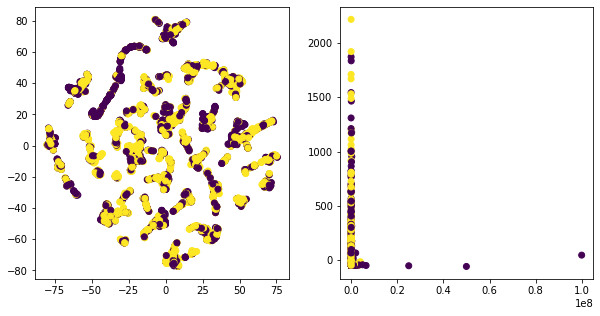

In [106]:
figure(figsize=(10, 5))
subplot(121)
scatter(X_tsne[:, 0], X_tsne[:, 1], c=df2.state_new[:5000])
subplot(122)
scatter(X_pca[:, 0], X_pca[:, 1], c=df2.state_new[:5000]);

In [133]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectors = TfidfVectorizer().fit_transform(df2[:5000])

In [134]:
print(repr(vectors))

<19x20 sparse matrix of type '<class 'numpy.float64'>'
	with 20 stored elements in Compressed Sparse Row format>


In [135]:
from sklearn.decomposition import TruncatedSVD
#X_reduced = PCA(n_components=50).fit_transform(X)
X_reduced = TruncatedSVD(n_components=19, random_state=0).fit_transform(vectors)

In [126]:
X_embedded = TSNE(n_components=2, perplexity=40, verbose=2).fit_transform(X_reduced)

[t-SNE] Computing 18 nearest neighbors...
[t-SNE] Indexed 19 samples in 0.000s...
[t-SNE] Computed neighbors for 19 samples in 0.002s...
[t-SNE] Computed conditional probabilities for sample 19 / 19
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] Computed conditional probabilities in 0.002s
[t-SNE] Iteration 50: error = 50.0299568, gradient norm = 0.5978048 (50 iterations in 0.123s)
[t-SNE] Iteration 100: error = 47.9239883, gradient norm = 0.5336849 (50 iterations in 0.090s)
[t-SNE] Iteration 150: error = 44.0991592, gradient norm = 0.4853798 (50 iterations in 0.149s)
[t-SNE] Iteration 200: error = 42.3977203, gradient norm = 0.2920278 (50 iterations in 0.165s)
[t-SNE] Iteration 250: error = 51.8088531, gradient norm = 0.4354290 (50 iterations in 0.047s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 51.808853
[t-SNE] Iteration 300: error = 0.6457393, gradient norm = 0.0010600 (50 iterations in 0.023s)
[t-SNE] Iteration 350: error = 0.4469002, gradient norm = 

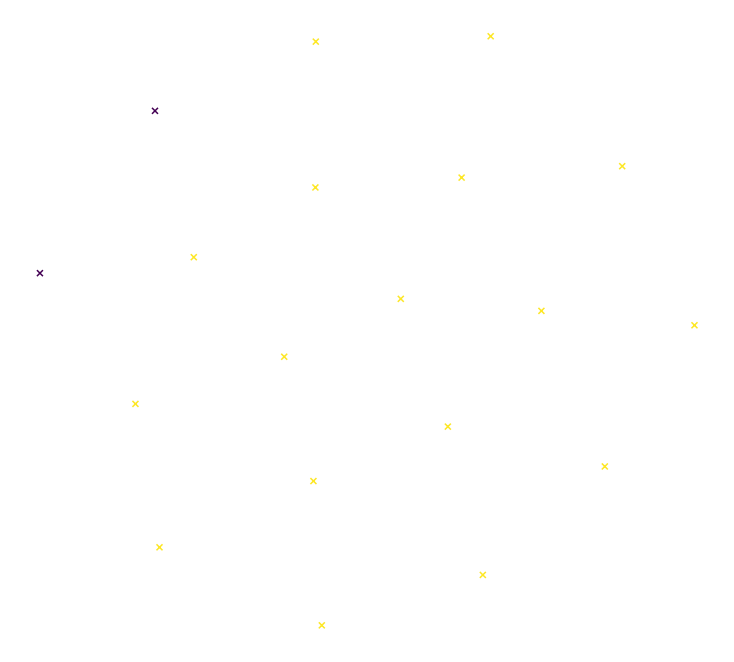

In [127]:
fig = figure(figsize=(10, 10))
ax = axes(frameon=False)
setp(ax, xticks=(), yticks=())
subplots_adjust(left=0.0, bottom=0.0, right=1.0, top=0.9,
                wspace=0.0, hspace=0.0)
scatter(X_embedded[:, 0], X_embedded[:, 1],
        c=y[:19], marker="x")

* ### ExtremeGradientBoosting models
By Hassan

In [58]:
# Fit model to training data
XGB = XGBClassifier(random_state=1)
XGB.fit(X_train, y_train)

[14:49:25] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=4, num_parallel_tree=1, random_state=1,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [59]:
# Make predictions on test set 
y_pred = XGB.predict(X_test)

In [60]:
# Evaluate your model 
cr = precision_score(y_test, y_pred)
print("Precision: %.2f%%" % (cr * 100.0))

Precision: 70.56%


* ### Decision Tree 
by Carla

In [61]:
# import the regressor 
DT = DecisionTreeClassifier(random_state=1)
DT.fit(X_train, y_train)

y_pred = DT.predict(X_test)
    
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))
print('accuracy of DT:', accuracy_score(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.53      0.52      0.52       499
           1       0.68      0.70      0.69       751

    accuracy                           0.63      1250
   macro avg       0.61      0.61      0.61      1250
weighted avg       0.62      0.63      0.62      1250

[[258 241]
 [227 524]]
accuracy of DT: 0.6256


* ### First perform Baseline model
By Sebastian

In [62]:
#baseline_pred = [1 for i in X_train if X_train.query("campaign_len == 30 and goal < 100000") else 0]
#baseline_pred1 = X_train["campaign_len"] == 30 and X_train["goal"] < 100000
baseline_pred1 = X_train["campaign_len"] == 30
baseline_pred2 = X_train["goal"] < 50000
baseline_pred = baseline_pred1 * baseline_pred2

In [63]:
cm = confusion_matrix(y_train, baseline_pred)
print(classification_report(y_train, baseline_pred))

              precision    recall  f1-score   support

           0       0.40      0.63      0.49      1499
           1       0.60      0.37      0.46      2251

    accuracy                           0.48      3750
   macro avg       0.50      0.50      0.48      3750
weighted avg       0.52      0.48      0.47      3750



* ### Support Vector Machine

In [64]:
svc = SVC(random_state=1)
svc.fit(X_train, y_train)

SVC(random_state=1)

In [65]:
y_pred = svc.predict(X_test)

In [66]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.90      0.04      0.07       499
           1       0.61      1.00      0.76       751

    accuracy                           0.61      1250
   macro avg       0.76      0.52      0.41      1250
weighted avg       0.73      0.61      0.48      1250



In [67]:
def print_model_results(X_train, X_test, y_train, y_test, clf1, clf2, clf3):
    clf1 = clf1()
    clf1.fit(X_train, y_train)
    y_pred1 = clf1.predict(X_test)
    print(f"Carla:  {classification_report(y_test, y_pred1)}")
    clf2 = clf2()
    clf2.fit(X_train, y_train)
    y_pred2 = clf2.predict(X_test)
    print(f"Hassan:  {classification_report(y_test, y_pred2)}")
    clf3 = clf3()
    clf3.fit(X_train, y_train)
    y_pred3 = clf3.predict(X_test)
    print(f"Sebastian:  {classification_report(y_test, y_pred3)}")

In [68]:
print_model_results(X_train, X_test, y_train, y_test, DecisionTreeClassifier, XGBClassifier, SVC)

Carla:                precision    recall  f1-score   support

           0       0.54      0.52      0.53       499
           1       0.69      0.71      0.70       751

    accuracy                           0.63      1250
   macro avg       0.62      0.61      0.61      1250
weighted avg       0.63      0.63      0.63      1250

[14:49:36] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Hassan:                precision    recall  f1-score   support

           0       0.63      0.49      0.55       499
           1       0.71      0.80      0.75       751

    accuracy                           0.68      1250
   macro avg       0.67      0.65      0.65      1250
weighted avg       0.67      0.68      0.67      1250

Sebastian:                precision    recall  

In [69]:
# Initialize a scaler, then apply it to the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Show an example of a record with scaling applied
#X_train.sample(1)

In [70]:
#print_model_results(X_train_scaled, X_test_scaled, y_train, y_test, DecisionTreeClassifier, XGBClassifier, SVC)

* ### HyperParamter Tuning for DT (Before and After)

In [71]:
param_grid = {'criterion':['entropy', 'gini'], 
              'max_depth':[6,7,8,9],
              'min_samples_leaf':[8,9,10,11,12]
             } 
# Instantiate gridsearch and define the metric to optimize 
gs_DT = GridSearchCV(DT, param_grid, scoring='precision',
                  cv=5, verbose=5, n_jobs=-1)

# TODO: Fit the grid search object to the training data and find the optimal parameters
gs_DT_fit = gs_DT.fit(X_train, y_train)

# Get the estimator
gs_DT_best = gs_DT_fit.best_estimator_ 

# Make predictions using the unoptimized and model
predictions = (DT.fit(X_train, y_train)).predict(X_test) # Normal
best_predictions = gs_DT_best.predict(X_test)  # After Tuning

Fitting 5 folds for each of 40 candidates, totalling 200 fits


In [72]:
# Report the before-and-afterscores
print("Unoptimized model\n------")
print("Precision score on testing data: {:.4f}".format(precision_score(y_test, predictions)))
print("Accuracy on testing data: {:.4f}".format(accuracy_score(y_test, predictions)))
print("\nOptimized Model\n------")
print("Final Precision score on the testing data: {:.4f}".format(precision_score(y_test, best_predictions)))
print("Final Accuracy on the testing data: {:.4f}".format(accuracy_score(y_test, best_predictions)))
# Best parameters
print('Best parameters:', gs_DT_fit.best_params_)

Unoptimized model
------
Precision score on testing data: 0.6850
Accuracy on testing data: 0.6256

Optimized Model
------
Final Precision score on the testing data: 0.6826
Final Accuracy on the testing data: 0.6496
Best parameters: {'criterion': 'gini', 'max_depth': 9, 'min_samples_leaf': 8}


* ### HyperParamter Tuning for SVC (Before and After)

In [184]:
param_grid = {'C':[5000, 10000],
              'kernel':['sigmoid', 'rbf']
             } 
# Instantiate gridsearch and define the metric to optimize 
gs_svc = GridSearchCV(svc, param_grid, scoring='precision',
                  cv=5, verbose=5, n_jobs=-1)

# TODO: Fit the grid search object to the training data and find the optimal parameters
gs_svc_fit = gs_svc.fit(X_train, y_train)

# Get the estimator
gs_svc_best = gs_svc_fit.best_estimator_ 

# Make predictions using the unoptimized and model
predictions = (svc.fit(X_train, y_train)).predict(X_test) # Normal
best_predictions = gs_svc_best.predict(X_test)  # After Tuning

Fitting 5 folds for each of 4 candidates, totalling 20 fits


In [185]:
# Report the before-and-afterscores
print("Unoptimized model\n------")
print("Precision score on testing data: {:.4f}".format(precision_score(y_test, predictions)))
print("Accuracy on testing data: {:.4f}".format(accuracy_score(y_test, predictions)))
print("\nOptimized Model\n------")
print("Final Precision score on the testing data: {:.4f}".format(precision_score(y_test, best_predictions)))
print("Final Accuracy on the testing data: {:.4f}".format(accuracy_score(y_test, best_predictions)))
# Best parameters
print('Best parameters:', gs_svc_fit.best_params_)

Unoptimized model
------
Precision score on testing data: 0.5965
Accuracy on testing data: 0.6024

Optimized Model
------
Final Precision score on the testing data: 0.6594
Final Accuracy on the testing data: 0.6076
Best parameters: {'C': 10000, 'kernel': 'sigmoid'}


* ### HyperParamter Tuning for XGBOOST (Before and After)

In [186]:
param_grid = {"learning_rate"    : [ 0.30, 0.50 ] ,
              "max_depth"        : [ 5, 6],
              "min_child_weight" : [3, 4],
              "colsample_bytree" : [ 0.4, 0.5 ],
              'n_estimators'     : [79, 80, 81],   

              }
# Instantiate gridsearch and define the metric to optimize 
gs_XGB = GridSearchCV(XGB, param_grid, scoring='precision',
                  cv=5, verbose=5, n_jobs=-1)


# TODO: Fit the grid search object to the training data and find the optimal parameters
gs_XGB_fit = gs_XGB.fit(X_train, y_train)

# Get the estimator
gs_XGB_best = gs_XGB_fit.best_estimator_ 

# Make predictions using the unoptimized and model
predictions = (XGB.fit(X_train, y_train)).predict(X_test) # Normal
best_predictions = gs_XGB_best.predict(X_test)  # After Tuning

Fitting 5 folds for each of 48 candidates, totalling 240 fits
[15:38:36] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[15:38:36] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


In [187]:
# Report the before-and-afterscores
print("Unoptimized model\n------")
print("Precision score on testing data: {:.4f}".format(precision_score(y_test, predictions)))
print("Accuracy on testing data: {:.4f}".format(accuracy_score(y_test, predictions)))
print("\nOptimized Model\n------")
print("Final Precision score on the testing data: {:.4f}".format(precision_score(y_test, best_predictions)))
print("Final Accuracy on the testing data: {:.4f}".format(accuracy_score(y_test, best_predictions)))
# Best parameters
print('Best parameters:', gs_XGB_fit.best_params_)

Unoptimized model
------
Precision score on testing data: 0.6995
Accuracy on testing data: 0.6828

Optimized Model
------
Final Precision score on the testing data: 0.7091
Final Accuracy on the testing data: 0.6940
Best parameters: {'colsample_bytree': 0.4, 'learning_rate': 0.5, 'max_depth': 5, 'min_child_weight': 4, 'n_estimators': 79}


* ### Visualizing Confusion Matrix using Best Params

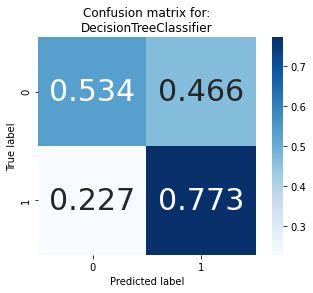

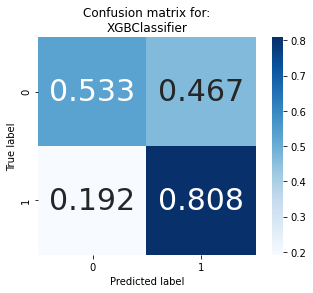

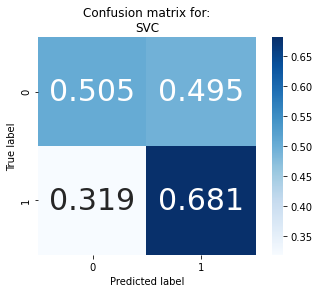

In [188]:
#Visualizing the confusion matrix for each classifier
from sklearn.metrics import confusion_matrix

for i,model in enumerate([gs_DT_best,gs_XGB_best,gs_svc_best]):
    cm = confusion_matrix(y_test, model.predict(X_test))
    cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] # normalize the data

    # view with a heatmap
    plt.figure(i)
    sns.heatmap(cm, annot=True, annot_kws={"size":30},
            cmap='Blues', square=True, fmt='.3f')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.title('Confusion matrix for:\n{}'.format(model.__class__.__name__));

* ### Feature importance before Best Params for Model: ... 

ValueError: The number of FixedLocator locations (5), usually from a call to set_ticks, does not match the number of ticklabels (10).

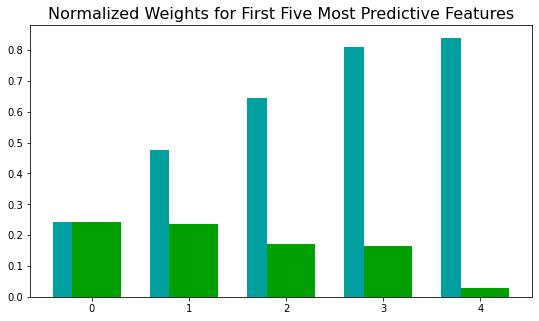

In [74]:
# Import functions from own Python-File (see visuals_script.py in Repo)
import visuals_script as vs
# TODO: Extract the feature importances
data = df2.copy(deep=True)
features = X_train
target = y_train
importances = DT.feature_importances_ # <<<<<<<<< Change models here !!!!!

# Plot
vs.feature_plot(importances, X_train, y_train)

* ### Feature importance after Best Params for Model: ...

In [ ]:
# Import functions from own Python-File (see visuals_script.py in Repo)
import visuals_script as vs
# TODO: Extract the feature importances
data = df2.copy(deep=True)
features = X_train
target = y_train
importances = gs_XGB_best.feature_importances_ # <<<<<<<<< Change models here !!!!!

# Plot
vs.feature_plot(importances, X_train, y_train)

In [ ]:
# Seeing the same in table form - Not important
from sklearn.metrics import confusion_matrix
import itertools

fi = pd.DataFrame({'feature': features,
                   'importance': XGB.feature_importances_}).\
                    sort_values('importance', ascending = False)
fi.head()

In [190]:
# Import functionality for cloning a model
from sklearn.base import clone

# Reduce the feature space
X_train_reduced = X_train[X_train.columns.values[(np.argsort(importances)[::-1])[:5]]]
X_test_reduced = X_test[X_test.columns.values[(np.argsort(importances)[::-1])[:5]]]

# Train on the "best" model found from grid search earlier
clf = (clone(gs_DT_best)).fit(X_train_reduced, y_train)

# Make new predictions
reduced_predictions = clf.predict(X_test_reduced)

# Report scores from the final model using both versions of data
print("Final Model trained on full data\n------")
print("Accuracy on testing data: {:.4f}".format(accuracy_score(y_test, best_predictions)))
print("Precision on testing data: {:.4f}".format(precision_score(y_test, best_predictions)))
print("\nFinal Model trained on reduced data\n------")
print("Accuracy on testing data: {:.4f}".format(accuracy_score(y_test, reduced_predictions)))
print("Precision on testing data: {:.4f}".format(precision_score(y_test, reduced_predictions)))

Final Model trained on full data
------
Accuracy on testing data: 0.6940
Precision on testing data: 0.7091

Final Model trained on reduced data
------
Accuracy on testing data: 0.6180
Precision on testing data: 0.6278


* ### Voting Classifier using Best Params

In [191]:
from sklearn.ensemble import VotingClassifier


model1 = VotingClassifier(estimators=[('xgb', gs_XGB_fit), ('dt', gs_DT_fit), ('svc', gs_svc_best)], voting='hard')

model1.fit(X_train,y_train)

model1.score(X_test,y_test)

Fitting 5 folds for each of 48 candidates, totalling 240 fits
[15:41:34] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Fitting 5 folds for each of 40 candidates, totalling 200 fits


0.6916

* ### Stacking

In [192]:
# Implementation of Stacking in Scikit-Learn

from sklearn.ensemble import StackingClassifier

estimators = [
    ('dt', gs_DT_best),
    ('xgb', gs_XGB_best,
    ('svc', gs_svc_best))
]

clf = StackingClassifier(
    estimators=estimators, final_estimator=svc
)

clf.fit(X_train, y_train).score(X_test, y_test)
# With final estimator as svc we get the best score.

[15:41:38] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[15:41:39] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[15:41:39] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[15:41:39] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective

0.6944

* ### Tree Visualization

In [193]:

# Export a tree from the forest
export_graphviz(gs_DT_best, 'tree_from_optimized_forest.dot', rounded = True, 
                feature_names=X_train.columns, max_depth = 8, 
                class_names = ['Success', 'Fail'], filled = True)

NameError: name 'export_graphviz' is not defined

In [194]:
from subprocess import call
from IPython.display import Image

call(['dot', '-Tpng', 'tree_from_optimized_forest.dot', '-o', 'tree_from_optimized_forest.png', '-Gdpi=200'])
Image('tree_from_optimized_forest.png')

In [195]:
import joblib
filename = "./models/ML_Algo.sav"
joblib.dump(gs_XGB_best, filename) # <-- swap name with final model

['./models/ML_Algo.sav']